In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

#!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim
import urllib.request
import json
from bs4 import BeautifulSoup
from urllib.request import urlopen
import requests
from pandas.io.json import json_normalize

import matplotlib.cm as cm
import matplotlib.colors as colors
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as colors
%matplotlib inline
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes
import folium

print('Libraries imported.')

Libraries imported.


In [119]:
#get a data-set of crimes in salt lake city(downloaded on kaggle)
df1 = pd.read_csv(r'C:\Users\felix\Desktop\coursera\salt lake city,crime\slc-crime\SLC_Police_Cases_2016_cleaned_geocoded.csv')


In [5]:
df1.describe()

,Unnamed: 0,day of week,y_coordinate,x_coordinate,x_gps_coords,y_gps_coords
count,61240.00000,61240.000000,5.557900e+04,6.051400e+04,55579.000000,55579.000000
mean,30619.50000,4.083132,9.616907e+05,1.884926e+06,-111.755781,40.672947
std,17678.60958,1.944392,2.956102e+06,2.925709e+06,5.372417,3.058414
min,0.00000,1.000000,0.000000e+00,0.000000e+00,-118.457241,-73.285003
25%,15309.75000,2.000000,8.768370e+05,1.882351e+06,-111.915513,40.739895
50%,30619.50000,4.000000,8.843420e+05,1.889051e+06,-111.899550,40.760534
75%,45929.25000,6.000000,8.870980e+05,1.894281e+06,-111.879530,40.767992
max,61239.00000,7.000000,1.111111e+08,1.111111e+08,88.421094,40.840264


In [7]:
df1.shape

(61240, 17)

In [8]:
#clear the datasate_df1 and drop the unneccecary columns
df_clear= df1.drop(columns=['y_coordinate','x_coordinate','Unnamed: 0','ncic code','occurred','reported','police grid','city'])
df_clear.tail()


,﻿case,description,ibr,day of week,location,city council,police zone,x_gps_coords,y_gps_coords
61235,SL2016235945,DRUGS,35A,2,100 S RIO GRANDE ST ...,4,Z3,-111.903987,40.765513
61236,SL2016228081,LARCENY,23C,7,000 E 1700 S ...,5,Z5,-111.890725,40.733588
61237,SL2016226107,PUBLIC PEACE,0,1,800 S 300 E ...,4,Z3,-111.882599,40.750846
61238,SL2016234642,DUI ALCOHOL,90D,7,200 W 500 S ...,4,Z3,-111.898268,40.758553
61239,SL2016238195,OBST POLICE,13B,5,100 W 600 S ...,4,Z3,-111.896122,40.756381


In [9]:
df_clear['day of week'].unique()

array([6, 3, 7, 1, 5, 4, 2], dtype=int64)

In [13]:
from collections import Counter

day =Counter(df_clear['day of week']).keys() # equals to list(set(words))
day

dict_keys([6, 3, 7, 1, 5, 4, 2])

In [20]:
crime_day=Counter(df_clear['day of week']).values()
crime_day

dict_values([9516, 8950, 8396, 7238, 9099, 9259, 8782])

In [25]:

Tage = pd.DataFrame({'Wochentag' :[6, 3, 7, 1, 5, 4, 2], 'crime_day' :[9516, 8950, 8396, 7238, 9099, 9259, 8782]})
Tage


,Wochentag,crime_day
0,6,9516
1,3,8950
2,7,8396
3,1,7238
4,5,9099
5,4,9259
6,2,8782


In [27]:
Tagenew = Tage.sort_values(["Wochentag"], ascending = True)

Tagenew

,Wochentag,crime_day
3,1,7238
6,2,8782
1,3,8950
5,4,9259
4,5,9099
0,6,9516
2,7,8396


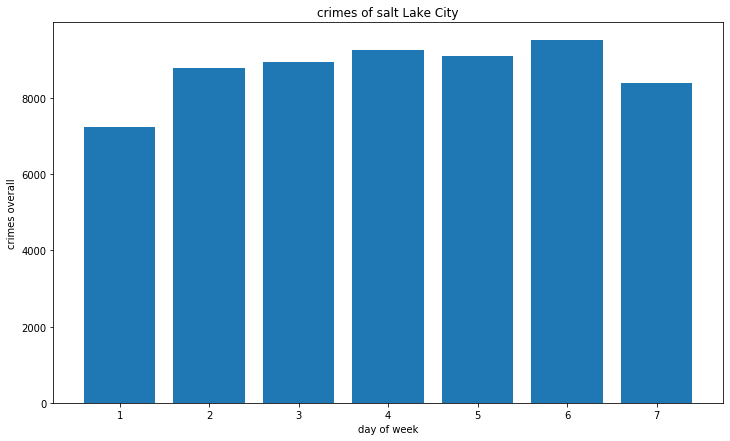

In [37]:
plt.figure(figsize=(12,7))

plt.bar(Tagenew.Wochentag, Tagenew.crime_day)
 
plt.title('crimes of salt Lake City')
plt.ylabel('crimes overall')
plt.xlabel('day of week')

plt.show()
#the distribution of crimes in Salt Lake City per day of week(1= Monday, 2= Tuesday, etc....)

In [44]:
#the sam procedure for the type of crimes
df_clear['description'].unique()
from collections import Counter

typecrime =Counter(df_clear['description']).keys()

#typecrime=Counter(df_clear['description']).values()
typecrime


dict_keys(['STOLEN VEHICLE', 'DUI ALCOHOL', 'ALCOHOL IN VEH', 'HIT AND RUN', 'PUBLIC PEACE', 'PUBLIC ORDER', 'ASSAULT', 'LARCENY', 'DAMAGED PROP', 'DRUGS', 'IMP/ABAND VEH', 'ROBBERY', 'INV OF PRIVACY', 'NON MOV TRAF', 'TA- CITY EQUIP', 'ESCAPE', 'STOLEN PROP', 'CONSERVATION', 'WEAPON OFFENSE', 'REPORTABLE TA', 'FRAUD', 'NONREPTABL TA', 'BURGLARY', 'FORGERY', 'OBST POLICE', 'DUI DRUGS', 'LIQUOR', 'ARPRT TITLE 16', 'MORALS-DECENCY', 'KIDNAP', 'FLEEING', 'DUI - CLS A', 'PORNOGRAPHY', 'COMMERCIAL SEX', 'TA-COUNTY EQUI', 'MOV TRAF VIOL', 'DUI - FEL3', 'TRAFFIC', 'INSP COMM VEH', 'OBST JUDICIAL', 'WEAPONS', 'GAMBLING', 'THREATS', 'ARSON', 'EMBEZZLEMENT', nan, 'EXTORTION', 'HEALTH/SAFETY', 'OFCR INV TA', 'PUB PEACE-HOST', 'COUNTERFEITING', 'TA W/COMM VEH', 'AIRPLANE CRASH', 'HOMICIDE', 'PROPERTY CRIME', 'ABORTION', 'TA-INJ/DRUGS', 'TA-INJ/ALCOHOL', 'TA INV TRAIN', 'ARPLN CRASH MI', 'EXPLOITATION', 'MORALS-ANML CR', 'OBST JUD'])

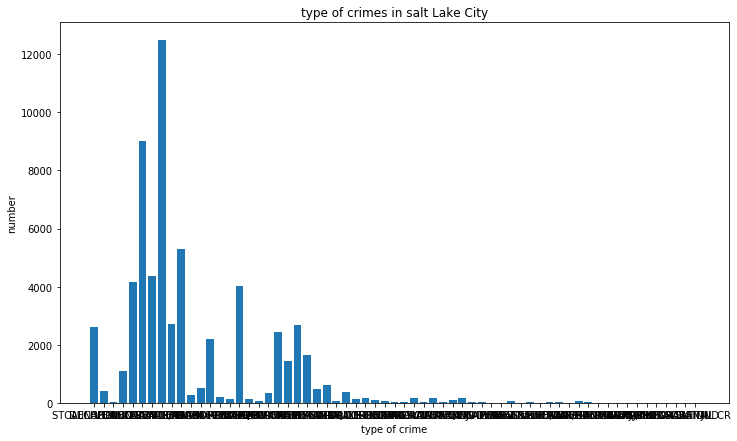

In [48]:

Crime_x = pd.DataFrame({'type' :['STOLEN VEHICLE', 'DUI ALCOHOL', 'ALCOHOL IN VEH', 'HIT AND RUN', 'PUBLIC PEACE', 'PUBLIC ORDER', 'ASSAULT', 'LARCENY', 'DAMAGED PROP', 'DRUGS', 'IMP/ABAND VEH', 'ROBBERY', 'INV OF PRIVACY', 'NON MOV TRAF', 'TA- CITY EQUIP', 'ESCAPE', 'STOLEN PROP', 'CONSERVATION', 'WEAPON OFFENSE', 'REPORTABLE TA', 'FRAUD', 'NONREPTABL TA', 'BURGLARY', 'FORGERY', 'OBST POLICE', 'DUI DRUGS', 'LIQUOR', 'ARPRT TITLE 16', 'MORALS-DECENCY', 'KIDNAP', 'FLEEING', 'DUI - CLS A', 'PORNOGRAPHY', 'COMMERCIAL SEX', 'TA-COUNTY EQUI', 'MOV TRAF VIOL', 'DUI - FEL3', 'TRAFFIC', 'INSP COMM VEH', 'OBST JUDICIAL', 'WEAPONS', 'GAMBLING', 'THREATS', 'ARSON', 'EMBEZZLEMENT', 'nan', 'EXTORTION', 'HEALTH/SAFETY', 'OFCR INV TA', 'PUB PEACE-HOST', 'COUNTERFEITING', 'TA W/COMM VEH', 'AIRPLANE CRASH', 'HOMICIDE', 'PROPERTY CRIME', 'ABORTION', 'TA-INJ/DRUGS', 'TA-INJ/ALCOHOL', 'TA INV TRAIN', 'ARPLN CRASH MI', 'EXPLOITATION', 'MORALS-ANML CR', 'OBST JUD'], 'value' :[2600, 401, 21, 1108, 4146, 8997, 4383, 12478, 2730, 5282, 276, 524, 2206, 191, 135, 4029, 135, 55, 350, 2436, 1456, 2682, 1658, 489, 599, 74, 374, 129, 160, 98, 75, 17, 21, 172, 14, 178, 12, 96, 167, 16, 11, 5, 7, 49, 7, 11, 8, 32, 40, 6, 45, 20, 3, 6, 4, 1, 2, 2, 2, 2, 4, 2, 1]})
plt.figure(figsize=(12,7))

plt.bar(Crime_x.type, Crime_x.value)
 
plt.title('type of crimes in salt Lake City')
plt.ylabel('number')
plt.xlabel('type of crime')

plt.show()


In [53]:
Crime_xsort= Crime_x.sort_values(['value'], ascending = False)
Crime_xsort.head()

,type,value
7,LARCENY,12478
5,PUBLIC ORDER,8997
9,DRUGS,5282
6,ASSAULT,4383
4,PUBLIC PEACE,4146


In [54]:
#i just wanted to see if there are a lot of overlapping gps data(but there are not)the following steps are not neccecary. i wanted to get a bit more familiar with the dataset
df_clear['x_gps_coords'].unique()

array([-111.92456865, -111.89689662, -111.89406162, ..., -111.89965435,
       -111.95525097, -111.88259909])

In [120]:
df_grouped=df_clear.groupby('x_gps_coords')

  


In [56]:
df_clear['x_gps_coords'].count()

55579

In [57]:
df_clear['city council'].unique()

array(['2', '4', 'SL', '5', '3', '1', '7', nan, '6', 'INV', 'Z6', 'Z1',
       '0', 'A', 'Z4', 'Z5', 'Z3', 'Z2', '49', '40', '02', '43', 'WVC',
       '48', 'D3', '33', '07', 'ADM', '11', '42', '13', '143', 'UI', '53',
       'L'], dtype=object)

In [58]:
X = []

In [59]:
X= df_clear['x_gps_coords']

In [60]:
Y= df_clear['y_gps_coords']

In [62]:
# clear the rows, where no Lat or lon is given
T=df_clear.loc[:,['description','x_gps_coords','y_gps_coords']]
T.rename(columns={"x_gps_coords": "latitude", "y_gps_coords": "longitude"},inplace= True)
T.head(10)

,description,latitude,longitude
0,STOLEN VEHICLE,-111.924569,40.737917
1,DUI ALCOHOL,-111.896897,40.758555
2,DUI ALCOHOL,-111.894062,40.759542
3,ALCOHOL IN VEH,-111.971064,40.776482
4,DUI ALCOHOL,-111.891190,40.749720
5,HIT AND RUN,-111.880435,40.760737
6,DUI ALCOHOL,-111.885360,40.747617
7,PUBLIC PEACE,-111.848726,40.779466
8,PUBLIC ORDER,-111.923397,40.746762
9,ASSAULT,-111.877815,40.755069


In [63]:
Y_axis = T[['latitude']]
X_axis = T[['longitude']]
result = Y_axis.isnull() 
print(result)
T.dropna(subset=["latitude"], axis=0, inplace=True)
T.dropna(subset=["longitude"], axis=0, inplace=True)
# reset index, because we droped two rows
T.reset_index(drop=True, inplace=True)
T

       latitude
0         False
1         False
2         False
3         False
4         False
5         False
6         False
7         False
8         False
9         False
10        False
11        False
12        False
13        False
14        False
15        False
16        False
17        False
18        False
19        False
20        False
21        False
22        False
23        False
24        False
25        False
26        False
27        False
28        False
29        False
30        False
31        False
32        False
33        False
34        False
35        False
36        False
37        False
38        False
39        False
40        False
41        False
42        False
43        False
44        False
45        False
46        False
47        False
48        False
49        False
50        False
51        False
52        False
53        False
54        False
55        False
56        False
57        False
58        False
59        False
60        False
61      

,description,latitude,longitude
0,STOLEN VEHICLE,-111.924569,40.737917
1,DUI ALCOHOL,-111.896897,40.758555
2,DUI ALCOHOL,-111.894062,40.759542
3,ALCOHOL IN VEH,-111.971064,40.776482
4,DUI ALCOHOL,-111.891190,40.749720
5,HIT AND RUN,-111.880435,40.760737
6,DUI ALCOHOL,-111.885360,40.747617
7,PUBLIC PEACE,-111.848726,40.779466
8,PUBLIC ORDER,-111.923397,40.746762
9,ASSAULT,-111.877815,40.755069


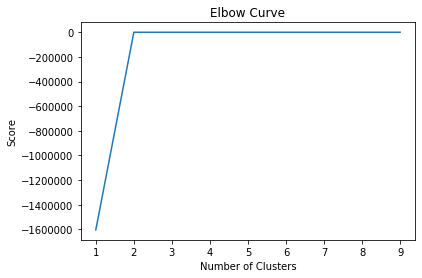

In [64]:
#how many cluster are usefull, in this case two, but i decided to cluster the crimes in 5 cluster 
Y_axis = T[['latitude']]
X_axis = T[['longitude']]

K_clusters = range(1,10)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = T[['latitude']]
X_axis = T[['longitude']]
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
# Visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [65]:
T.describe()

,latitude,longitude
count,55579.000000,55579.000000
mean,-111.755781,40.672947
std,5.372417,3.058414
min,-118.457241,-73.285003
25%,-111.915513,40.739895
50%,-111.899550,40.760534
75%,-111.879530,40.767992
max,88.421094,40.840264


In [66]:
T.head(200)

,description,latitude,longitude
0,STOLEN VEHICLE,-111.924569,40.737917
1,DUI ALCOHOL,-111.896897,40.758555
2,DUI ALCOHOL,-111.894062,40.759542
3,ALCOHOL IN VEH,-111.971064,40.776482
4,DUI ALCOHOL,-111.891190,40.749720
5,HIT AND RUN,-111.880435,40.760737
6,DUI ALCOHOL,-111.885360,40.747617
7,PUBLIC PEACE,-111.848726,40.779466
8,PUBLIC ORDER,-111.923397,40.746762
9,ASSAULT,-111.877815,40.755069


In [76]:
#Clustering the gps data of the dataset in 5 parts
kmeans = KMeans(init="k-means++", n_clusters=5, n_init=12)

kmeans.fit(T[T.columns[1:3]]) # Compute k-means clustering.

T['cluster_label'] = kmeans.fit_predict(T[T.columns[1:3]])

centers = kmeans.cluster_centers_ # Coordinates of cluster centers.

labels = kmeans.predict(T[T.columns[1:3]]) # Labels of each point
#T.head(50)
T.describe()#here i can be sure there are the same counts of lon and lat in the set to go further

,latitude,longitude,cluster_label
count,55579.000000,55579.000000,55579.000000
mean,-111.755781,40.672947,1.998848
std,5.372417,3.058414,1.243226
min,-118.457241,-73.285003,0.000000
25%,-111.915513,40.739895,2.000000
50%,-111.899550,40.760534,2.000000
75%,-111.879530,40.767992,2.000000
max,88.421094,40.840264,4.000000


In [77]:
centers# the center of position 2 is very strange and i decided to drop this center because i expect thats not a valid datapoint

array([[-111.85346394,   40.73469438],
       [  88.42109444,  -73.28500298],
       [-111.89748311,   40.75507794],
       [-118.45724057,   38.11965276],
       [-111.95052856,   40.77455785]])

IndexError: index 3 is out of bounds for axis 1 with size 2

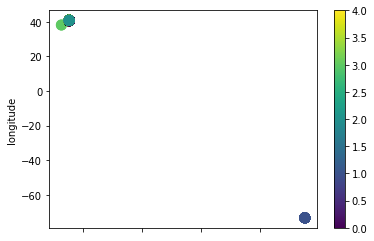

In [78]:
T.plot.scatter(x = 'latitude', y = 'longitude', c=labels, s=100, cmap='viridis')
plt.scatter(centers[:, 3], centers[:, 3], c='black', s=200, alpha=0.5)

In [79]:
centers

array([[-111.85346394,   40.73469438],
       [  88.42109444,  -73.28500298],
       [-111.89748311,   40.75507794],
       [-118.45724057,   38.11965276],
       [-111.95052856,   40.77455785]])

In [80]:
T.groupby('cluster_label').mean()

,latitude,longitude
cluster_label,,
0,-111.854999,40.732359
1,88.421094,-73.285003
2,-111.897061,40.757257
3,-118.457241,38.119653
4,-111.952917,40.771099


In [81]:
T.head(20)

,description,latitude,longitude,cluster_label
0,STOLEN VEHICLE,-111.924569,40.737917,2
1,DUI ALCOHOL,-111.896897,40.758555,2
2,DUI ALCOHOL,-111.894062,40.759542,2
3,ALCOHOL IN VEH,-111.971064,40.776482,4
4,DUI ALCOHOL,-111.891190,40.749720,2
5,HIT AND RUN,-111.880435,40.760737,2
6,DUI ALCOHOL,-111.885360,40.747617,2
7,PUBLIC PEACE,-111.848726,40.779466,0
8,PUBLIC ORDER,-111.923397,40.746762,2
9,ASSAULT,-111.877815,40.755069,2


In [82]:
T.describe()
T['cluster_label'].value_counts()   

2    34072
0    10739
4    10726
1       40
3        2
Name: cluster_label, dtype: int64

In [84]:
# i delete the data points with label 1, which represents the strange lon and lat above and further i deleted the label 3, because ther a only 2 crimes
ge = T[T.cluster_label != 1]
ged = ge[ge.cluster_label != 3]

In [85]:
ged['cluster_label'].value_counts() 

2    34072
0    10739
4    10726
Name: cluster_label, dtype: int64

In [86]:
#create center and the crime rate according to it
data = [['34072',-111.897061,40.757257], ['10739', -111.854999,40.732359], ['10726', -111.952917,40.771099]] 
crime_gps = pd.DataFrame(data, columns = ['crime', 'lon','lat']) 
crime_gps

,crime,lon,lat
0,34072,-111.897061,40.757257
1,10739,-111.854999,40.732359
2,10726,-111.952917,40.771099


In [131]:

crime_gps.lat[0]

-111.89705365

In [88]:
data2= [['spot1',-111.934571 ,40.740516],['spot2',-112.015679,40.754463],['spot3',-111.939156,40.797924]]
other_spots = pd.DataFrame(data2, columns =['spot','lon','lat'])

other_spots
#

,spot,lon,lat
0,spot1,-111.934571,40.740516
1,spot2,-112.015679,40.754463
2,spot3,-111.939156,40.797924


In [89]:
#get lon and lat from Salt Lake City
from geopy.geocoders import Nominatim
address = 'Salt Lake City, Utah'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitudeSALT = location.latitude
longitudeSALT = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitudeSALT, longitudeSALT))

The geograpical coordinate of New York City are 40.7596198, -111.8867975.


In [90]:
m = folium.Map(
    location=[latitudeSALT,longitudeSALT],
    tiles='Stamen Toner',
    zoom_start=12
)
# Make a data frame with dots to show on the map
data = pd.DataFrame({
'lon':[crime_gps.lon[0],crime_gps.lon[1],crime_gps.lon[2]],
'lat':[crime_gps.lat[0],crime_gps.lat[1],crime_gps.lat[2]],
'crime':[crime_gps.crime[0],crime_gps.crime[1], crime_gps.crime[2]]
})
for i in range(0,3):
    folium.Marker([data.iloc[i]['lat'], data.iloc[i]['lon']], popup=data.iloc[i]['crime'],icon = folium.Icon(color='green'),).add_to(m)
    
data2 = pd.DataFrame({
'lon':[other_spots.lon[0],other_spots.lon[1],other_spots.lon[2]],
'lat':[other_spots.lat[0],other_spots.lat[1],other_spots.lat[2]],
'spot':[other_spots.spot[0],other_spots.spot[1], other_spots.spot[2]]
})
for i in range(0,3):
    folium.Marker([data2.iloc[i]['lat'], data2.iloc[i]['lon']], popup=data2.iloc[i]['spot'],icon = folium.Icon(color='blue'),).add_to(m)
# I can add marker one by one on the map

m

#display the "Hotspots=centers of the cluster on the map of Salt Lake City in green
#the other 3 spots i will compare to the cluster centers are displaced in blue 


In [91]:
#FOOOOOOOOOOOOOOOURSQAAAAAAAAAAAAAAAAAAAARE

In [92]:
#get the venues on a radius of 400 arround the centers of the three crime clusters

In [93]:
CLIENT_ID = 'xxE' # your Foursquare ID
CLIENT_SECRET = 'x' # your Foursquare Secret
VERSION = '20180604'
LIMIT = 30
radius= 400
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)


Your credentails:
CLIENT_ID: DUCC5JJA2PFFT2AO2UJULNTDOPBUAC5CGXY5TTL04KTUR3QE
CLIENT_SECRET:4WOMR2U533IVECOKIQQ0L5QWXNFKT5TZT40JZZU1B5IT3UUW


In [94]:
url0 = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, crime_gps.lat[0], crime_gps.lon[0], VERSION, radius, LIMIT)
url0




'https://api.foursquare.com/v2/venues/explore?client_id=DUCC5JJA2PFFT2AO2UJULNTDOPBUAC5CGXY5TTL04KTUR3QE&client_secret=4WOMR2U533IVECOKIQQ0L5QWXNFKT5TZT40JZZU1B5IT3UUW&ll=40.757257,-111.897061&v=20180604&radius=400&limit=30'

In [95]:
import requests
results = requests.get(url0).json()
'There are {} venues around location 1.'.format(len(results['response']['groups'][0]['items']))



'There are 26 venues around location 1.'

In [96]:
url1 = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, crime_gps.lat[1], crime_gps.lon[1], VERSION, radius, LIMIT)
url1

results = requests.get(url1).json()
'There are {} venues around location 2.'.format(len(results['response']['groups'][0]['items']))

'There are 3 venues around location 2.'

In [97]:
url2 = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, crime_gps.lat[2], crime_gps.lon[2], VERSION, radius, LIMIT)
url2

results = requests.get(url2).json()
'There are {} venues around location 3.'.format(len(results['response']['groups'][0]['items']))

'There are 12 venues around location 3.'

In [98]:
#get the venues on a radius arround the other three spots(blue) 

In [99]:
url_other1 = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, other_spots.lat[0], other_spots.lon[0], VERSION, radius, LIMIT)
url_other1
url_other2 = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, other_spots.lat[1], other_spots.lon[1], VERSION, radius, LIMIT)
url_other2
url_other3 = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, other_spots.lat[2], other_spots.lon[2], VERSION, radius, LIMIT)
url_other3

'https://api.foursquare.com/v2/venues/explore?client_id=DUCC5JJA2PFFT2AO2UJULNTDOPBUAC5CGXY5TTL04KTUR3QE&client_secret=4WOMR2U533IVECOKIQQ0L5QWXNFKT5TZT40JZZU1B5IT3UUW&ll=40.797924,-111.939156&v=20180604&radius=400&limit=30'

In [100]:
results = requests.get(url_other1).json()
'There are {} venues around location 1 of the other spot.'.format(len(results['response']['groups'][0]['items']))

'There are 2 venues around location 1 of the other spot.'

In [101]:
results = requests.get(url_other2).json()
'There are {} venues around location 2.'.format(len(results['response']['groups'][0]['items']))

'There are 0 venues around location 2.'

In [102]:
results = requests.get(url_other3).json()
'There are {} venues around location 3.'.format(len(results['response']['groups'][0]['items']))

'There are 4 venues around location 3.'

In [103]:
crime_spots =[26,3,12]
sum(crime_spots)
#there a in sum 41 venues arround the centers of the crime clusters ( green)

41

In [104]:
non_crime_spots = [2,0,4]
sum(non_crime_spots)
##there are in sum 6 venues arround the centers of the non crime spots ( blue)

6

In [105]:
#barchart of the crimes + total venues ,add list of venues to crime_gps
crime_gps['venues_around']= crime_spots
crime_gps

,crime,lon,lat,venues_around
0,34072,-111.897061,40.757257,26
1,10739,-111.854999,40.732359,3
2,10726,-111.952917,40.771099,12


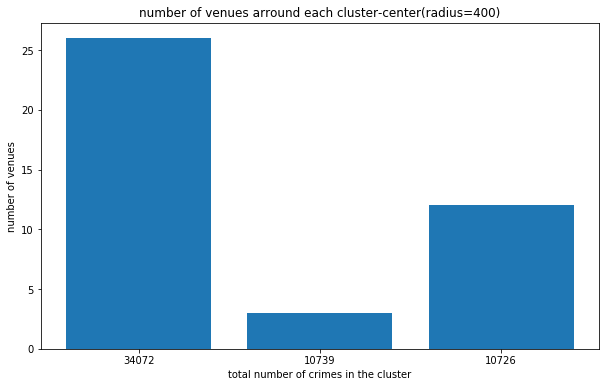

In [118]:
plt.figure(figsize=(10,6))

plt.bar(crime_gps.crime, crime_gps.venues_around)
 
plt.title('number of venues arround each cluster-center(radius=400)')
plt.ylabel('number of venues')
plt.xlabel('total number of crimes in the cluster')

plt.show()


TypeError: __init__() got an unexpected keyword argument 'figsize'

{'reasons': {'count': 0,
  'items': [{'summary': 'This spot is popular',
    'type': 'general',
    'reasonName': 'globalInteractionReason'}]},
 'venue': {'id': '4aef3e28f964a520dbd621e3',
  'name': 'State Liquor Store',
  'location': {'address': '1255 W North Temple',
   'lat': 40.77121700434472,
   'lng': -111.92773518114338,
   'labeledLatLngs': [{'label': 'display',
     'lat': 40.77121700434472,
     'lng': -111.92773518114338}],
   'distance': 219,
   'postalCode': '84116',
   'cc': 'US',
   'city': 'Salt Lake City',
   'state': 'UT',
   'country': 'United States',
   'formattedAddress': ['1255 W North Temple',
    'Salt Lake City, UT 84116',
    'United States']},
  'categories': [{'id': '4bf58dd8d48988d186941735',
    'name': 'Liquor Store',
    'pluralName': 'Liquor Stores',
    'shortName': 'Liquor Store',
    'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_liquor_',
     'suffix': '.png'},
    'primary': True}],
  'photos': {'count': 0, 'groups': []}},


C:\Users\felix\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  


,venue.name,venue.categories,venue.location.address,venue.location.lat,venue.location.lng,venue.location.labeledLatLngs,venue.location.distance,venue.location.postalCode,venue.location.cc,venue.location.city,venue.location.state,venue.location.country,venue.location.formattedAddress,venue.id
0,State Liquor Store,"[{'id': '4bf58dd8d48988d186941735', 'name': 'L...",1255 W North Temple,40.771217,-111.927735,"[{'label': 'display', 'lat': 40.77121700434472...",219,84116,US,Salt Lake City,UT,United States,"[1255 W North Temple, Salt Lake City, UT 84116...",4aef3e28f964a520dbd621e3
1,Nico's Restaurant & Lounge,"[{'id': '4bf58dd8d48988d1c1941735', 'name': 'M...",1458 W North Temple,40.771802,-111.932923,"[{'label': 'display', 'lat': 40.77180199748422...",326,84116,US,Salt Lake City,UT,United States,"[1458 W North Temple, Salt Lake City, UT 84116...",51894158498ea8c4c5d5b054
2,Salt Lake City KOA,"[{'id': '52f2ab2ebcbc57f1066b8b53', 'name': 'R...",1400 W North Temple,40.773232,-111.931931,"[{'label': 'display', 'lat': 40.7732321, 'lng'...",397,84116,US,Salt Lake City,UT,United States,"[1400 W North Temple, Salt Lake City, UT 84116...",4bc42829dce4eee1c6fa719d
3,City Creek Pizza,"[{'id': '4bf58dd8d48988d1ca941735', 'name': 'P...",1306 W North Temple,40.771611,-111.928456,"[{'label': 'display', 'lat': 40.771611, 'lng':...",209,84116,US,Salt Lake City,UT,United States,"[1306 W North Temple, Salt Lake City, UT 84116...",4e30b1b714954cb0e5f30ac8
4,TRAX Power Station,"[{'id': '4bf58dd8d48988d1fc931735', 'name': 'L...",1500 W North Temple,40.771529,-111.934359,"[{'label': 'display', 'lat': 40.77152912542941...",416,84116,US,Salt Lake City,UT,United States,"[1500 W North Temple, Salt Lake City, UT 84116...",51698928498ec8d97f7b9161
5,TRAX Fairpark,"[{'id': '4bf58dd8d48988d1fc931735', 'name': 'L...",1150 West North Temple,40.771556,-111.924537,"[{'label': 'display', 'lat': 40.77155568516672...",477,84116,US,Salt Lake City,UT,United States,"[1150 West North Temple, Salt Lake City, UT 84...",516988bee4b032fb37e26577


NameError: name 'get_category_type' is not defined